In [1]:
import sys
sys.path.insert(1, '../')
print(sys.path)

['/home/cboned/Projects/Koopman-Learning/notebooks', '../', '/home/cboned/miniconda3/envs/graphocr/lib/python310.zip', '/home/cboned/miniconda3/envs/graphocr/lib/python3.10', '/home/cboned/miniconda3/envs/graphocr/lib/python3.10/lib-dynload', '', '/home/cboned/miniconda3/envs/graphocr/lib/python3.10/site-packages']


In [2]:
import os
os.environ["TOKENIZERS_PARALLELISM"] = "false"
os.environ["CUDA_VISIBLE_DEVICES"] = "5"


import torch
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)


from collections import defaultdict
import tqdm
from datasets import Collator

from sklearn.decomposition import PCA
import os

from torchvision.datasets import CIFAR100, CIFAR10
from torch.utils.data import DataLoader

from transformers import ViTForImageClassification , ViTImageProcessor
from models.ode_transformer_gpt  import ViTNeuralODE
import numpy as np
import scienceplots

from torchdiffeq import odeint
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import seaborn as sns
from sklearn.manifold import TSNE


cuda


In [3]:
def plot_trajectories_comparison(teacher_trajectories, student_trajectories, 
                               reduction_method='pca', figsize=(15, 10)):
    """
    Plot trajectories from teacher and student models in the same plot.
    
    Args:
        teacher_trajectories: torch.Tensor of shape [B, T1, D] - teacher model trajectories
        student_trajectories: torch.Tensor of shape [B, T2, D] - student model trajectories  
        reduction_method: str - 'pca' or 'tsne' for dimensionality reduction
        figsize: tuple - figure size
    """
    # Convert to numpy
    teacher_traj = teacher_trajectories.detach().cpu().numpy()
    student_traj = student_trajectories.detach().cpu().numpy()
    
    B, T1, D = teacher_traj.shape
    _, T2, _ = student_traj.shape
    
    # Reshape for dimensionality reduction: [B*T1 + B*T2, D]
    teacher_flat = teacher_traj.reshape(-1, D)
    student_flat = student_traj.reshape(-1, D)
    all_points = np.concatenate([teacher_flat, student_flat], axis=0)
    
    # Apply dimensionality reduction
    if reduction_method == 'pca':
        reducer = PCA(n_components=2, random_state=42)
        reduced_points = reducer.fit_transform(all_points)
        title_suffix = f"PCA (explained variance: {reducer.explained_variance_ratio_.sum():.2f})"
    elif reduction_method == 'tsne':
        reducer = TSNE(n_components=2, random_state=42, perplexity=min(30, len(all_points)//4))
        reduced_points = reducer.fit_transform(all_points)
        title_suffix = "t-SNE"
    
    # Split back into teacher and student
    teacher_2d = reduced_points[:B*T1].reshape(B, T1, 2)
    student_2d = reduced_points[B*T1:].reshape(B, T2, 2)
    
    # Create the plot
    fig, ax = plt.subplots(figsize=figsize)
    
    # Color palette for different samples
    colors = plt.cm.Set3(np.linspace(0, 1, B))
    
    # Plot trajectories
    for i in range(B):
        # Teacher trajectory (solid line)
        ax.plot(teacher_2d[i, :, 0], teacher_2d[i, :, 1], 
                color=colors[i], linewidth=2.5, alpha=0.8, 
                linestyle='-', label=f'Teacher Sample {i+1}' if i < 5 else "")
        
        # Student trajectory (dashed line, same color)
        ax.plot(student_2d[i, :, 0], student_2d[i, :, 1], 
                color=colors[i], linewidth=2.5, alpha=0.8, 
                linestyle='--', label=f'Student Sample {i+1}' if i < 5 else "")
        
        # Mark start points (circles)
        ax.scatter(teacher_2d[i, 0, 0], teacher_2d[i, 0, 1], 
                  color=colors[i], s=80, marker='o', edgecolor='black', 
                  linewidth=1.5, alpha=0.9)
        ax.scatter(student_2d[i, 0, 0], student_2d[i, 0, 1], 
                  color=colors[i], s=80, marker='s', edgecolor='black', 
                  linewidth=1.5, alpha=0.9)
        
        # Mark end points (stars)
        ax.scatter(teacher_2d[i, -1, 0], teacher_2d[i, -1, 1], 
                  color=colors[i], s=120, marker='*', edgecolor='black', 
                  linewidth=1.5, alpha=0.9)
        ax.scatter(student_2d[i, -1, 0], student_2d[i, -1, 1], 
                  color=colors[i], s=120, marker='P', edgecolor='black', 
                  linewidth=1.5, alpha=0.9)
    
    # Create custom legend
    legend_elements = [
        Line2D([0], [0], color='black', linewidth=2, linestyle='-', label='Teacher Trajectory'),
        Line2D([0], [0], color='black', linewidth=2, linestyle='--', label='Student Trajectory'),
        Line2D([0], [0], marker='o', color='w', markerfacecolor='gray', 
               markersize=8, label='Start (Teacher)', markeredgecolor='black'),
        Line2D([0], [0], marker='s', color='w', markerfacecolor='gray', 
               markersize=8, label='Start (Student)', markeredgecolor='black'),
        Line2D([0], [0], marker='*', color='w', markerfacecolor='gray', 
               markersize=10, label='End (Teacher)', markeredgecolor='black'),
        Line2D([0], [0], marker='P', color='w', markerfacecolor='gray', 
               markersize=10, label='End (Student)', markeredgecolor='black')
    ]
    
    ax.legend(handles=legend_elements, loc='upper right', frameon=True, 
              fancybox=True, shadow=True)
    
    ax.set_title(f'Teacher vs Student Model Trajectories Comparison\n({title_suffix}) - T_teacher={T1}, T_student={T2}', 
                 fontsize=16, fontweight='bold', pad=20)
    ax.set_xlabel('Component 1', fontsize=12, fontweight='bold')
    ax.set_ylabel('Component 2', fontsize=12, fontweight='bold')
    ax.grid(True, alpha=0.3)
    ax.set_facecolor('#f8f9fa')
    
    plt.tight_layout()
    return fig



def plot_final_states_scatter(teacher_trajectories, student_trajectories, 
                            acc_t, acc_edo, agreement, reduction_method='pca', 
                            figsize=(12, 10)):
    """
    Scatter plot of final hidden states with distance lines and classification indicators.
    
    Args:
        teacher_trajectories: torch.Tensor - teacher trajectories [B, T1, D]
        student_trajectories: torch.Tensor - student trajectories [B, T2, D]
        acc_t: list - teacher model accuracy for each sample
        acc_edo: list - student model accuracy for each sample
        agreement: list - agreement between models for each sample
        reduction_method: str - 'pca' or 'tsne'
        figsize: tuple - figure size
    """
    # Get final states (last time step)
    teacher_final = teacher_trajectories[:, -1, :].detach().cpu().numpy()
    student_final = student_trajectories[:, -1, :].detach().cpu().numpy()
    
    # Combine for dimensionality reduction
    all_final_states = np.concatenate([teacher_final, student_final], axis=0)
    
    if reduction_method == 'pca':
        reducer = PCA(n_components=2, random_state=42)
        reduced_states = reducer.fit_transform(all_final_states)
        title_suffix = f"PCA (explained variance: {reducer.explained_variance_ratio_.sum():.2f})"
    elif reduction_method == 'tsne':
        reducer = TSNE(n_components=2, random_state=42, perplexity=min(30, len(all_final_states)//4))
        reduced_states = reducer.fit_transform(all_final_states)
        title_suffix = "t-SNE"
    
    # Split back
    B = len(teacher_final)
    teacher_final_2d = reduced_states[:B]
    student_final_2d = reduced_states[B:]
    
    # Create the plot
    fig, ax = plt.subplots(figsize=figsize)
    
    # Determine colors and markers based on accuracy and agreement
    for i in range(B):
        # Determine color based on classification correctness
        both_correct = acc_t[i] == 1 and acc_edo[i] == 1
        both_wrong = acc_t[i] == 0 and acc_edo[i] == 0
        disagreement = acc_t[i] != acc_edo[i]
        
        if both_correct:
            color = 'green'
        elif both_wrong:
            color = 'red'
        else:  # disagreement
            color = 'orange'
        
        # Determine marker based on agreement
        if agreement[i] == 1:
            teacher_marker = 'o'
            student_marker = 'o'
        else:
            teacher_marker = '^'
            student_marker = 's'
        
        # Plot teacher point
        ax.scatter(teacher_final_2d[i, 0], teacher_final_2d[i, 1], 
                  color=color, s=120, marker=teacher_marker, 
                  edgecolor='black', linewidth=2, alpha=0.8,
                  label='Teacher' if i == 0 else "")
        
        # Plot student point  
        ax.scatter(student_final_2d[i, 0], student_final_2d[i, 1], 
                  color=color, s=120, marker=student_marker, 
                  edgecolor='white', linewidth=2, alpha=0.8,
                  label='Student' if i == 0 else "")
        
        # Draw line between corresponding points
        ax.plot([teacher_final_2d[i, 0], student_final_2d[i, 0]], 
                [teacher_final_2d[i, 1], student_final_2d[i, 1]], 
                color=color, alpha=0.6, linewidth=1.5, linestyle=':')
        
        # Add sample number annotation
        mid_x = (teacher_final_2d[i, 0] + student_final_2d[i, 0]) / 2
        mid_y = (teacher_final_2d[i, 1] + student_final_2d[i, 1]) / 2
        ax.annotate(f'{i+1}', (mid_x, mid_y), fontsize=9, ha='center', va='center',
                   bbox=dict(boxstyle='round,pad=0.2', facecolor='white', alpha=0.7))
    
    # Create comprehensive legend
    legend_elements = [
        Line2D([0], [0], marker='o', color='w', markerfacecolor='green', 
               markersize=10, label='Both Correct', markeredgecolor='black'),
        Line2D([0], [0], marker='o', color='w', markerfacecolor='red', 
               markersize=10, label='Both Wrong', markeredgecolor='black'),
        Line2D([0], [0], marker='o', color='w', markerfacecolor='orange', 
               markersize=10, label='Disagreement', markeredgecolor='black'),
        Line2D([0], [0], marker='o', color='w', markerfacecolor='gray', 
               markersize=10, label='Agreement (same marker)', markeredgecolor='black'),
        Line2D([0], [0], marker='^', color='w', markerfacecolor='gray', 
               markersize=10, label='No Agreement (diff markers)', markeredgecolor='black'),
        Line2D([0], [0], color='gray', linewidth=2, linestyle=':', label='Distance Line')
    ]
    
    ax.legend(handles=legend_elements, loc='upper right', frameon=True, 
              fancybox=True, shadow=True)
    
    ax.set_title(f'Final Hidden States Comparison\n({title_suffix})', 
                 fontsize=16, fontweight='bold', pad=20)
    ax.set_xlabel('Component 1', fontsize=12, fontweight='bold')
    ax.set_ylabel('Component 2', fontsize=12, fontweight='bold')
    ax.grid(True, alpha=0.3)
    ax.set_facecolor('#f8f9fa')
    
    plt.tight_layout()
    return fig


def plot_distance_distributions(teacher_trajectories, student_trajectories, 
                               acc_t, acc_edo, agreement, figsize=(15, 5)):
    """
    Plot distributions of distances between final teacher and student states.
    
    Args:
        teacher_trajectories: torch.Tensor - teacher trajectories [B, T1, D]
        student_trajectories: torch.Tensor - student trajectories [B, T2, D]
        acc_t: list - teacher model accuracy
        acc_edo: list - student model accuracy  
        agreement: list - agreement between models
        figsize: tuple - figure size
    """
    # Calculate distances between final states
    teacher_final = teacher_trajectories[:, -1, :].detach().cpu()
    student_final = student_trajectories[:, -1, :].detach().cpu()
    
    distances = torch.norm(teacher_final - student_final, dim=1).numpy()
    
    # Categorize distances
    both_correct_distances = []
    both_wrong_distances = []
    disagreement_distances = []
    agreement_distances = []
    no_agreement_distances = []
    
    for i in range(len(distances)):
        dist = distances[i]
        
        # Classification-based categorization
        if acc_t[i] == 1 and acc_edo[i] == 1:
            both_correct_distances.append(dist)
        elif acc_t[i] == 0 and acc_edo[i] == 0:
            both_wrong_distances.append(dist)
        else:
            disagreement_distances.append(dist)
        
        # Agreement-based categorization
        if agreement[i] == 1:
            agreement_distances.append(dist)
        else:
            no_agreement_distances.append(dist)
    
    # Create subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=figsize)
    
    # Plot 1: Distribution by classification correctness
    ax1.hist([both_correct_distances, both_wrong_distances, disagreement_distances], 
             bins=15, alpha=0.7, label=['Both Correct', 'Both Wrong', 'Disagreement'],
             color=['green', 'red', 'orange'], density=True, edgecolor='black')
    
    ax1.set_title('Distance Distribution by Classification', fontsize=14, fontweight='bold')
    ax1.set_xlabel('Distance between Final States', fontsize=12, fontweight='bold')
    ax1.set_ylabel('Density', fontsize=12, fontweight='bold')
    ax1.legend(frameon=True, fancybox=True, shadow=True)
    ax1.grid(True, alpha=0.3)
    ax1.set_facecolor('#f8f9fa')
    
    # Add statistics text
    stats_text = f'Both Correct: μ={np.mean(both_correct_distances):.3f}, σ={np.std(both_correct_distances):.3f}\n'
    stats_text += f'Both Wrong: μ={np.mean(both_wrong_distances):.3f}, σ={np.std(both_wrong_distances):.3f}\n'
    stats_text += f'Disagreement: μ={np.mean(disagreement_distances):.3f}, σ={np.std(disagreement_distances):.3f}'
    ax1.text(0.02, 0.98, stats_text, transform=ax1.transAxes, fontsize=9,
             verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    
    # Plot 2: Distribution by agreement
    ax2.hist([agreement_distances, no_agreement_distances], 
             bins=15, alpha=0.7, label=['Agreement', 'No Agreement'],
             color=['blue', 'purple'], density=True, edgecolor='black')
    
    ax2.set_title('Distance Distribution by Model Agreement', fontsize=14, fontweight='bold')
    ax2.set_xlabel('Distance between Final States', fontsize=12, fontweight='bold')
    ax2.set_ylabel('Density', fontsize=12, fontweight='bold')
    ax2.legend(frameon=True, fancybox=True, shadow=True)
    ax2.grid(True, alpha=0.3)
    ax2.set_facecolor('#f8f9fa')
    
    # Add statistics text
    stats_text2 = f'Agreement: μ={np.mean(agreement_distances):.3f}, σ={np.std(agreement_distances):.3f}\n'
    stats_text2 += f'No Agreement: μ={np.mean(no_agreement_distances):.3f}, σ={np.std(no_agreement_distances):.3f}'
    ax2.text(0.02, 0.98, stats_text2, transform=ax2.transAxes, fontsize=9,
             verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    
    plt.tight_layout()
    return fig

In [4]:
# Set Matplotlib style
plt.style.use("science")
plt.rcParams['text.usetex'] = False

plt.rcParams.update(
    {
        "font.size": 12,
        "axes.titlesize": 14,
        "axes.labelsize": 13,
        "legend.fontsize": 11,
        "figure.dpi": 300,
    }
)


In [5]:
EDO_CHECKPOINT_PATH = "/data/users/cboned/checkpoints/EDO_DISTILLATION_VIT_ON_CIFAR100_DINO_500EPOCHS_TRUE.pt"
TEACHER_CHECKPOINT_PATH = "../checkpoints/Vit_CIFAR100_DINO_JASMIN.pt"
DATASET_PATH = "/data/users/cboned/cifar"

In [6]:
train_dataset = CIFAR100(root=DATASET_PATH, download=False, train=True)
validation_dataset = CIFAR100(root=DATASET_PATH, download=False, train=False)


In [7]:
batch_size = 256

processor = ViTImageProcessor.from_pretrained("facebook/dino-vitb16")
collator = Collator(processor)
train_dloader = DataLoader(train_dataset, 
                           shuffle=True,
                           batch_size=batch_size,
                           pin_memory=False,
                           num_workers=8,
                           collate_fn=collator.classification_collate_fn
                           )


test_dloader = DataLoader(validation_dataset,
                          batch_size=128,
                          pin_memory=False,
                          num_workers=0,
                          shuffle=True,
                          collate_fn=collator.classification_collate_fn

)


In [8]:
teacher_model = ViTForImageClassification.from_pretrained(TEACHER_CHECKPOINT_PATH).to(device)
teacher_model = teacher_model.eval()

In [9]:
edo_model = ViTNeuralODE(
    img_size=224,
    patch_size=16,
    in_chans=3,
    mlp_ratio=1,
    num_classes=100,
    embed_dim=768,
    num_heads=12,
    emulate_depth=12.0,
    time_interval=1.0,   # match 12 "layers" by integrating over [0,12]
    num_eval_steps=36,
    solver="euler",
    register_tokens=10,
    pos_embed_register_tokens=False
)

edo_model.patch_embed.pos_embed = (
    teacher_model.vit.embeddings.position_embeddings)

try:
    edo_model.load_state_dict(torch.load(EDO_CHECKPOINT_PATH, weights_only=True)["state_dict"])
except Exception as e:
    print(e)
    print("Matching individual Weights")
    weight_to_update = torch.load(EDO_CHECKPOINT_PATH, weights_only=True)
    for w in weight_to_update.keys():
        if edo_model.state_dict().get(w) is not None:
            edo_model.state_dict()[w].data.copy_(weight_to_update[w])
                
edo_model = edo_model.to(device)



model = edo_model.eval()


## Image Visualization

In [12]:


for batch_idx, data in enumerate(train_dloader):

    inputs: dict = data["pixel_values"].to(device)
    images_plot = data["raw_images"]
    with torch.no_grad():
        output = model(**inputs, output_hidden_states=True)
        x_norm_patchtokens = output["states"][-1,:,1:-10].cpu().numpy()
    break
#with torch.no_grad()


In [13]:
x_norm_patchtokens.shape

(256, 196, 768)

In [13]:
from sklearn.preprocessing import minmax_scale
from sklearn.decomposition import PCA
import os.path as osp
output_folder = "."
masks = []

img_size=224
img_cnt = batch_size

patch_h = patch_w = img_size // 16

x_norm_1616_patches = x_norm_patchtokens.reshape(img_cnt*patch_h*patch_w, -1)

fg_pca = PCA(n_components=1)
fg_pca_images = fg_pca.fit_transform(x_norm_1616_patches)
fg_pca_images = minmax_scale(fg_pca_images)
fg_pca_images = fg_pca_images.reshape(img_cnt, patch_h*patch_w)

masks = []
for i in range(img_cnt):
    image_patches = fg_pca_images[i,:]
    mask = (image_patches > 0.6).ravel()
    #mask = (image_patches > 0.7).ravel()
    masks.append(mask)
    
for i in range(img_cnt):
    mask = masks[i]
    image_patches = fg_pca_images[i,:]
    image_patches[np.logical_not(mask)] = 0
    image_patches = image_patches.reshape([patch_h, patch_w])

    plt.subplot(442+i)
    plt.imshow(images_plot[i])
    plt.imshow(image_patches, extent=(0,img_size,img_size,0), alpha=0.5)
plt.savefig(osp.join(output_folder, "fg_mask.jpg"))
plt.close()

pca = PCA(n_components=3)
fg_patches = np.vstack([x_norm_patchtokens[i,masks[i],:] for i in range(img_cnt)])
pca_features = pca.fit_transform(fg_patches)
fg_result = minmax_scale(pca_features)

mask_indices = [0, *np.cumsum([np.sum(m) for m in masks]), -1]

plt.figure(figsize=(8, 8))
for i in range(img_cnt):
    plt.subplot(img_cnt, 2, 2*i+1)
    plt.axis("off")
    plt.imshow(images_plot[i])

    plt.subplot(img_cnt, 2, 2*i+2)
    plt.axis("off")
    pca_results = np.zeros((patch_h*patch_w, 3), dtype='float32')
    pca_results[masks[i]] = fg_result[mask_indices[i]:mask_indices[i+1]]
    pca_results = pca_results.reshape(patch_h, patch_w, 3)
    plt.imshow(pca_results)
    
    
plt.savefig(osp.join(output_folder, "results.jpg"))
plt.close()

### Raw
pca = PCA(n_components=3)
pca_features = pca.fit_transform(x_norm_patchtokens.reshape(img_cnt*patch_h*patch_w, -1))
pca_features = pca_features.reshape(img_cnt, patch_h*patch_w, 3)
for i in range(img_cnt):
    mask = masks[i]
    pca_features[i, ~mask] = np.min(pca_features[i])
pca_features = pca_features.reshape(img_cnt*patch_h*patch_w, -1)
fg_result = minmax_scale(pca_features)
fg_result = fg_result.reshape(img_cnt, patch_h, patch_w, 3)

plt.figure(figsize=(8, 8))
for i in range(img_cnt):
    plt.subplot(img_cnt, 2, 2*i+1)
    plt.axis("off")
    plt.imshow(images_plot[i])

    plt.subplot(img_cnt, 2, 2*i+2)
    plt.axis("off")
    plt.imshow(fg_result[i])
plt.savefig(osp.join(output_folder, "results_raw.jpg"))
plt.close()


# Average Distance

In [20]:
import torch
import numpy as np
import tqdm

def teacher_cls_hidden_distance_by_layer(dataloader, teacher_model,device, key:str="hidden_states", distance="l2"):
    """
    Compute mean distance between consecutive hidden representations 
    of the [CLS] token from the teacher model, averaged across the dataset.
    
    Returns one mean per layer transition (e.g., 12 if 13 layers).
    """
    teacher_model.eval()

    # store sums and counts per layer transition
    layer_sums = None
    layer_counts = None

    with torch.no_grad():
        for batch_idx, data in tqdm.tqdm(
            enumerate(dataloader),
            desc="Computing teacher [CLS] hidden distances",
            total=len(dataloader),
        ):
            inputs: dict = data["pixel_values"].to(device)

            # forward pass with hidden states
            output_t = teacher_model(**inputs, output_hidden_states=True)
            
            hidden_states = output_t[key] #torch.stack(output_t[key], dim=0)  
            # shape: (num_layers, batch, seq_len, hidden_dim)
            if isinstance(hidden_states, tuple):
                hidden_states = torch.stack(hidden_states, dim=0)
            # take [CLS] token (index 0 in seq_len)
            cls_states = hidden_states[:, :, 0, :]  # (num_layers, batch, hidden_dim)

            # compute diffs between consecutive layers
            diffs = cls_states[1:] - cls_states[:-1]  # (num_layers-1, batch, hidden_dim)

            if distance == "l2":
                dist = diffs.pow(2).sum(-1).sqrt()  # (num_layers-1, batch)
            elif distance == "cosine":
                h1 = cls_states[:-1]
                h2 = cls_states[1:]
                dist = 1 - torch.nn.functional.cosine_similarity(h1, h2, dim=-1)  # (num_layers-1, batch)
            else:
                raise ValueError("distance must be 'l2' or 'cosine'")

            # sum across batch for each layer transition
            if layer_sums is None:
                layer_sums = dist.sum(dim=1).cpu().numpy()   # (num_layers-1,)
                layer_counts = torch.tensor(dist.size(1)).repeat(dist.size(0)).numpy()
            else:
                layer_sums += dist.sum(dim=1).cpu().numpy()
                layer_counts += dist.size(1)

    # mean distance per layer transition
    layer_means = layer_sums / layer_counts
    return layer_means


layer_means = teacher_cls_hidden_distance_by_layer(test_dloader, teacher_model, device, key="hidden_states", distance="l2")
print("Mean [CLS] distances per layer transition:", layer_means)

Computing teacher [CLS] hidden distances: 100%|██████████| 40/40 [00:26<00:00,  1.50it/s]

Mean [CLS] distances per layer transition: [19.99545781 12.94912656  5.35416758  4.87117461  4.81573437  4.51636562
  5.20799492  5.69599023  6.13048164  6.04306133  6.44634023 53.51486875]


In [21]:
layer_means_train = teacher_cls_hidden_distance_by_layer(train_dloader, teacher_model, device, key="hidden_states", distance="l2")
print("Mean [CLS] distances per layer transition:", layer_means_train)

Computing teacher [CLS] hidden distances: 100%|██████████| 6250/6250 [01:35<00:00, 65.21it/s]

Mean [CLS] distances per layer transition: [19.99450625 12.949505    5.35348687  4.86699219  4.81463781  4.52093875
  5.21054063  5.69734125  6.1311925   6.05176188  6.4614325  53.514895  ]


In [22]:
def softmax_with_temperature(x, T=1.0):
    """
    Softmax with temperature.
    
    Args:
        x: numpy array or torch tensor
        T: temperature (>1 makes distribution smoother)
    """
    if isinstance(x, np.ndarray):
        x = torch.tensor(x, dtype=torch.float32)
    x = x / T
    x_exp = torch.exp(x - torch.max(x))  # stability trick
    return (x_exp / x_exp.sum()).cpu().numpy()


In [37]:
print("Mean [CLS] distances per layer transition:", softmax_with_temperature(torch.from_numpy(layer_means_train), T=100.0)*24)

distances = softmax_with_temperature(torch.from_numpy(layer_means_train), T=30.0)*24

steps = np.round(distances).astype(int)
checkpoints = np.cumsum(steps)

print(checkpoints)



Mean [CLS] distances per layer transition: [2.15971147 2.01279564 1.8655659  1.85651206 1.85554035 1.85009864
 1.86290105 1.87199177 1.88013107 1.87863827 1.88635028 3.01976351]
[ 2  4  5  6  7  8  9 10 11 12 13 20]


## Inference

In [10]:
from sklearn.metrics import confusion_matrix
import numpy as np

feats = []
teacher_feats = []
lab = []

acc_t = []
acc_edo = []
aggrement = []

# store preds and gts
all_labels = []
all_preds_t = []
all_preds_edo = []

for batch_idx, data in tqdm.tqdm(
    enumerate(test_dloader),
    desc="Extracting the PCA Vt for computing the trajectories",
    total=len(test_dloader),
):
    inputs: dict = data["pixel_values"].to(device)
    labels: torch.Tensor = data["labels"].to(device)

    with torch.no_grad():
        # --- teacher ---
        output_t = teacher_model(**inputs, output_hidden_states=True)
        hidden_states = torch.stack(output_t["hidden_states"])
        logits_t = output_t["logits"]

        pred_t = logits_t.argmax(-1)
        acc_t.append((pred_t == labels).float().mean().cpu().item())

        # --- student/edo ---
        last_points = hidden_states[:, :, 0]
        output_edo = model(**inputs, labels=labels, output_hidden_states=True)
        states = output_edo["states"]
        logits_edo = output_edo["logits"]

        pred_edo = logits_edo.argmax(-1)
        acc_edo.append((pred_edo == labels).float().mean().cpu().item())

        # agreement
        aggrement.append((pred_edo == pred_t).float().mean().cpu().item())

        teacher_feats.append(last_points.cpu().numpy())
        feats.append(states[:, :, 0].cpu().numpy())

        # store preds/labels for confusion matrix
        all_labels.extend(labels.cpu().numpy().tolist())
        all_preds_t.extend(pred_t.cpu().numpy().tolist())
        all_preds_edo.extend(pred_edo.cpu().numpy().tolist())

print(f"Agreement: {np.mean(aggrement):.4f}")
print(f"Accuracy EDO: {np.mean(acc_edo):.4f}")
print(f"Accuracy TEACHER: {np.mean(acc_t):.4f}")

# --- compute confusion matrices ---
cm_teacher = confusion_matrix(all_labels, all_preds_t)
cm_edo = confusion_matrix(all_labels, all_preds_edo)

print("\nConfusion Matrix (Teacher):")
print(cm_teacher)
print("\nConfusion Matrix (EDO):")
print(cm_edo)


Extracting the PCA Vt for computing the trajectories: 100%|██████████| 79/79 [01:07<00:00,  1.16it/s]

Agreement: 0.5478
Accuracy EDO: 0.7135
Accuracy TEACHER: 0.5939

Confusion Matrix (Teacher):
[[86  0  0 ...  0  0  0]
 [ 0 61  0 ...  0  0  0]
 [ 0  0 15 ...  0 10  0]
 ...
 [ 0  0  0 ... 41  0  0]
 [ 0  0  0 ...  0 55  0]
 [ 0  0  0 ...  0  0 69]]

Confusion Matrix (EDO):
[[90  0  0 ...  0  0  0]
 [ 0 88  0 ...  0  0  0]
 [ 0  0 59 ...  0  4  1]
 ...
 [ 0  0  0 ... 77  0  0]
 [ 0  1  4 ...  0 51  0]
 [ 0  1  0 ...  0  0 78]]


In [11]:
torch.cosine_similarity(model.patch_embed.cls_token.data[0], teacher_model.vit.embeddings.cls_token.data[0])

tensor([1.0000], device='cuda:0')

In [14]:
test_dloader = DataLoader(validation_dataset,
                          batch_size=1,
                          pin_memory=False,
                          num_workers=0,
                          shuffle=True,
                          collate_fn=collator.classification_collate_fn

)

In [15]:
LABEL_TO_EVALUATE = 98

In [16]:
feats = []
teacher_feats = []
lab = []

acc_t = []
acc_edo = []
aggrement = []

for batch_idx, data in tqdm.tqdm(
    enumerate(test_dloader),
    desc="Extracting the PCA Vt for computing the trajectories",
    total=len(test_dloader),
):
    
    inputs: dict = data["pixel_values"].to(device)
    labels: list = data["labels"]

    if labels.item() == LABEL_TO_EVALUATE:
        lab.append(labels.numpy())

        labels = labels.to(device)
        with torch.no_grad():
            output_t = teacher_model(**inputs, output_hidden_states=True)
            hidden_states = torch.stack(output_t["hidden_states"])
            logits_t = output_t["logits"]
            
            pred_t = logits_t.argmax(-1)
            acc_t.append((pred_t == labels).int().item())
            

            last_points = hidden_states[:, :, 0]
            output_edo = model(**inputs, labels=labels, output_hidden_states=True)
            states = output_edo["states"]
            logits_edo = output_edo["logits"]
            
            pred_edo = logits_edo.argmax(-1)
            acc_edo.append((pred_edo == labels).int().item())

            aggrement.append((pred_edo == pred_t).int().item())
            
            
            teacher_feats.append(last_points)
            feats.append(states[:, :, 0])
            

print(f"Aggrement Evaluating CLASS: {LABEL_TO_EVALUATE}: {np.mean(aggrement)}")
print(f"Accuracy EDO Evaluating CLASS: {LABEL_TO_EVALUATE}: {np.mean(acc_edo)}")
print(f"Accuracy TEACHER Evaluating CLASS: {LABEL_TO_EVALUATE}: {np.mean(acc_t)}")
    

Extracting the PCA Vt for computing the trajectories: 100%|██████████| 10000/10000 [00:13<00:00, 748.01it/s]

Aggrement Evaluating CLASS: 98: 0.47
Accuracy EDO Evaluating CLASS: 98: 0.51
Accuracy TEACHER Evaluating CLASS: 98: 0.55


In [17]:
len(lab)

100

In [18]:
print(np.mean(aggrement))
print(np.mean(acc_edo))
print(np.mean(acc_t))

0.47
0.51
0.55


In [19]:
(feats[0].shape)

torch.Size([36, 1, 768])

In [20]:
trajectories = torch.stack(feats, dim=0).squeeze(2)
teacher_trajectories = torch.stack(teacher_feats, dim=0).squeeze(2)
print(trajectories.shape)
print(teacher_trajectories.shape)

torch.Size([100, 36, 768])
torch.Size([100, 13, 768])


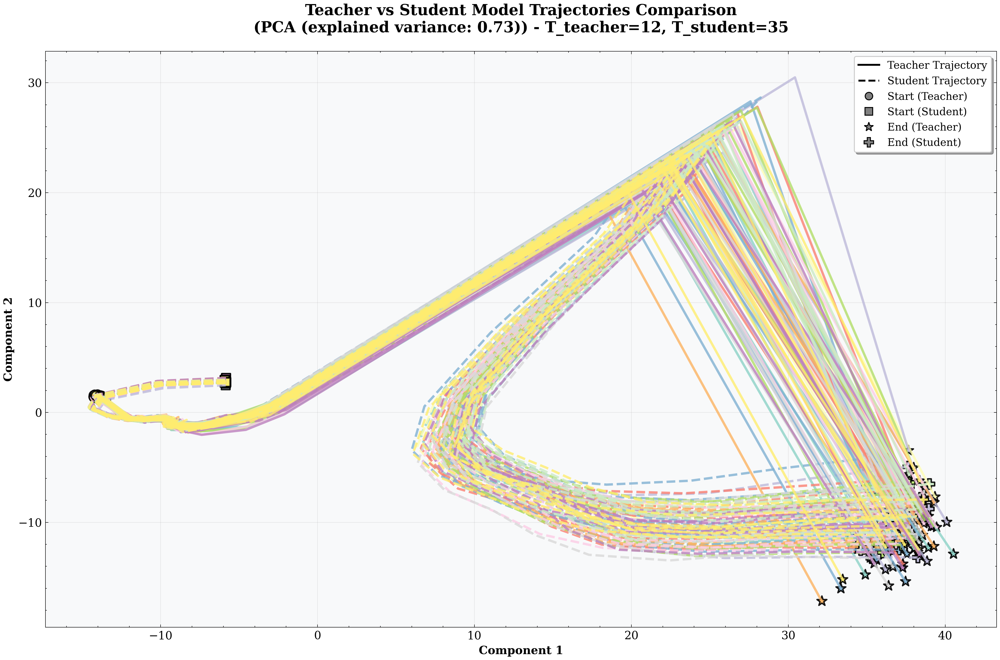

In [21]:
fig1 = plot_trajectories_comparison(teacher_trajectories[:, 1:, :], trajectories[:, 1:, :], reduction_method="pca")


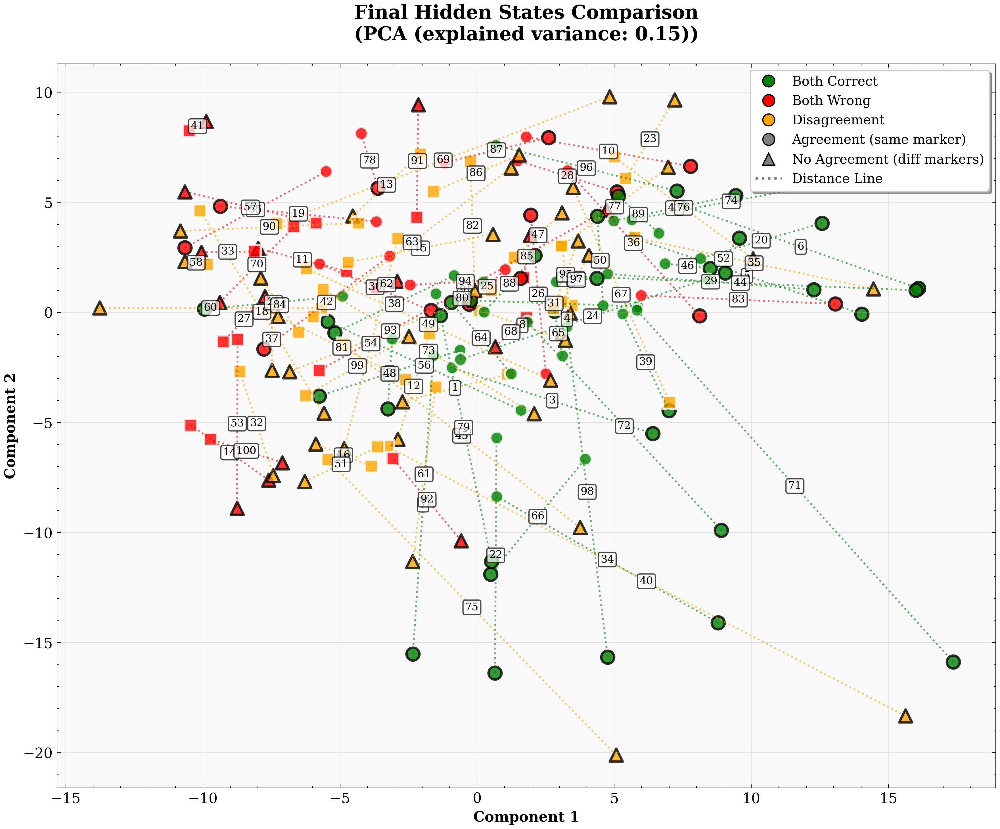

In [22]:
fig2 = plot_final_states_scatter(teacher_trajectories[:, 1:, :], trajectories[:, 1:, :], acc_t, acc_edo, aggrement)

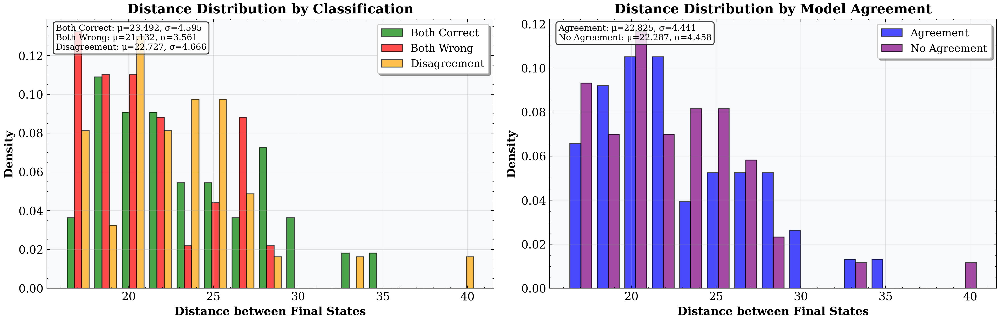

In [23]:
fig3 = plot_distance_distributions(teacher_trajectories[:, 1:, :], trajectories[:, 1:, :], acc_t, acc_edo, aggrement)

In [24]:
feats = []
teacher_feats = []
lab = []

acc_t = []
acc_edo = []
aggrement = []
LABEL_TO_EVALUATE = 4
for batch_idx, data in tqdm.tqdm(
    enumerate(test_dloader),
    desc="Extracting the PCA Vt for computing the trajectories",
    total=len(test_dloader),
):
    
    inputs: dict = data["pixel_values"].to(device)
    labels: list = data["labels"]

    if labels.item() == LABEL_TO_EVALUATE:
        lab.append(labels.numpy())

        labels = labels.to(device)
        with torch.no_grad():
            output_t = teacher_model(**inputs, output_hidden_states=True)
            hidden_states = torch.stack(output_t["hidden_states"])
            logits_t = output_t["logits"]
            
            pred_t = logits_t.argmax(-1)
            acc_t.append((pred_t == labels).int().item())
            

            model.patch_embed.cls_token = torch.nn.Parameter(hidden_states[-1, :, 0].clone()).to(device)

            last_points = hidden_states[:, :, 0]
            output_edo = model(**inputs, output_hidden_states=True)
            states = output_edo["states"]
            states_classifier = states[-1, :, 0]
            logits_edo = teacher_model.classifier(states_classifier)
            
            pred_edo = logits_edo.argmax(-1)
            acc_edo.append((pred_edo == labels).int().item())

            aggrement.append((pred_edo == pred_t).int().item())
            
            
            teacher_feats.append(last_points)
            feats.append(states[:, :, 0])
        #break
            

print(f"Aggrement Evaluating CLASS: {LABEL_TO_EVALUATE}: {np.mean(aggrement)}")
print(f"Accuracy EDO Evaluating CLASS: {LABEL_TO_EVALUATE}: {np.mean(acc_edo)}")
print(f"Accuracy TEACHER Evaluating CLASS: {LABEL_TO_EVALUATE}: {np.mean(acc_t)}")
    

Extracting the PCA Vt for computing the trajectories: 100%|██████████| 10000/10000 [00:14<00:00, 671.23it/s]

Aggrement Evaluating CLASS: 4: 0.05
Accuracy EDO Evaluating CLASS: 4: 0.0
Accuracy TEACHER Evaluating CLASS: 4: 0.83


In [25]:
trajectories = torch.stack(feats, dim=0).squeeze(2)
teacher_trajectories = torch.stack(teacher_feats, dim=0).squeeze(2)
print(trajectories.shape)
print(teacher_trajectories.shape)

torch.Size([100, 36, 768])
torch.Size([100, 13, 768])


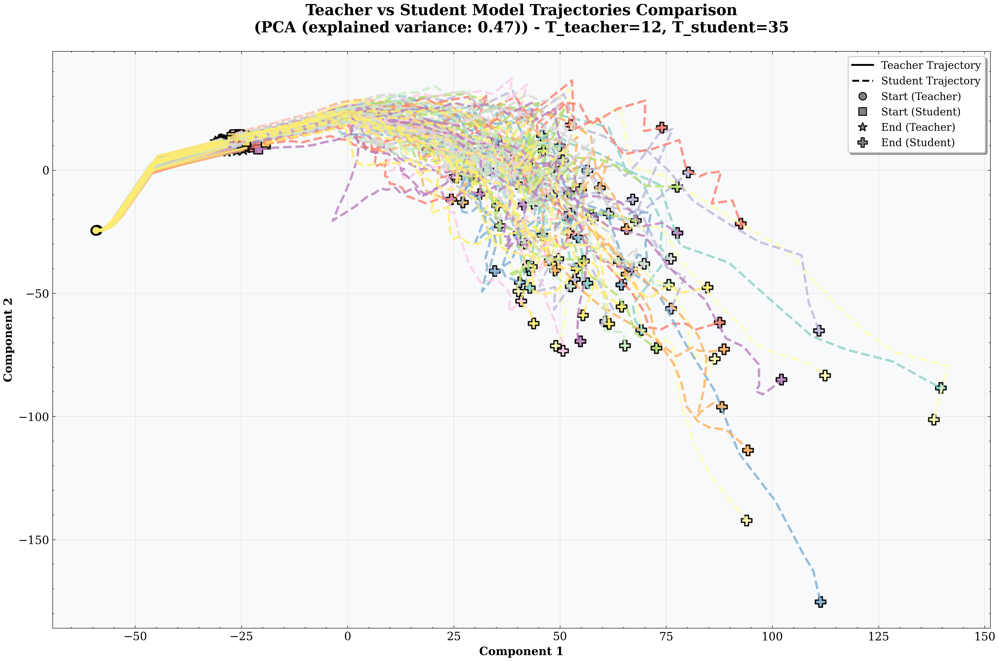

In [26]:
fig1 = plot_trajectories_comparison(teacher_trajectories[:, 1:, :], trajectories[:, 1:, :], reduction_method="pca")

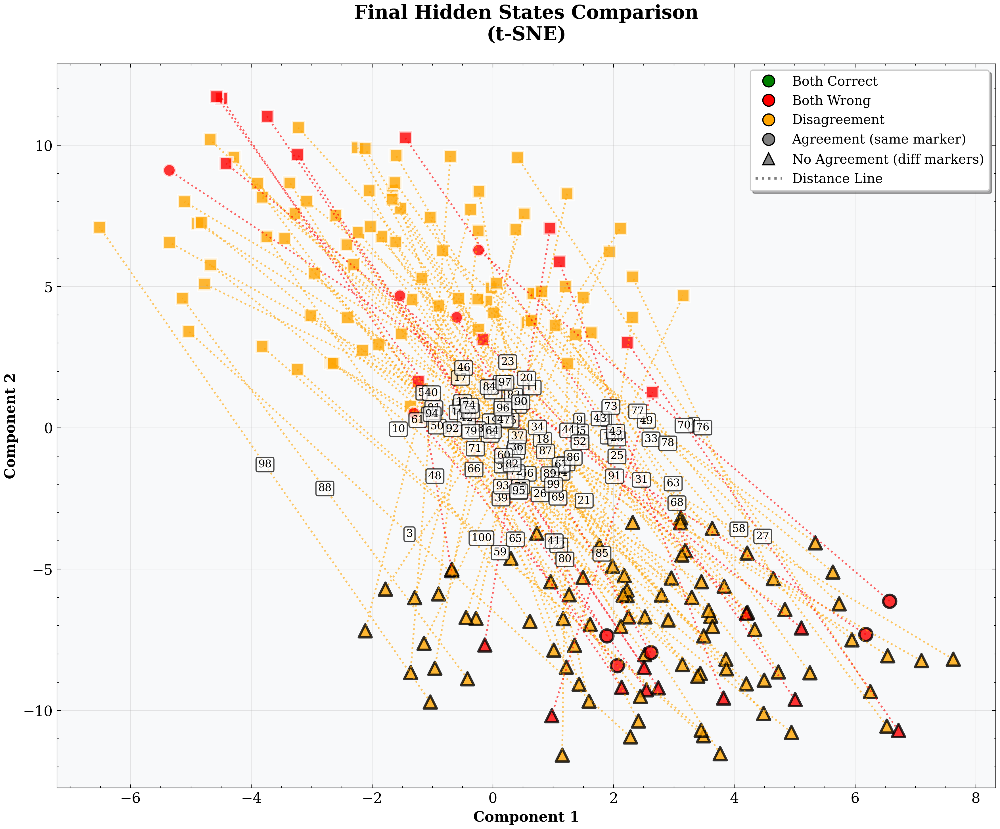

In [27]:
fig2 = plot_final_states_scatter(teacher_trajectories[:, 1:, :], trajectories[:, 1:, :], acc_t, acc_edo, aggrement, reduction_method="tsne")

/home/cboned/miniconda3/envs/graphocr/lib/python3.10/site-packages/numpy/lib/histograms.py:885: RuntimeWarning: divide by zero encountered in divide
  return n/db/n.sum(), bin_edges
/home/cboned/miniconda3/envs/graphocr/lib/python3.10/site-packages/numpy/lib/histograms.py:885: RuntimeWarning: invalid value encountered in divide
  return n/db/n.sum(), bin_edges
/home/cboned/miniconda3/envs/graphocr/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/cboned/miniconda3/envs/graphocr/lib/python3.10/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/cboned/miniconda3/envs/graphocr/lib/python3.10/site-packages/numpy/core/_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/cboned/miniconda3/envs/graphocr/lib/python3.10/s

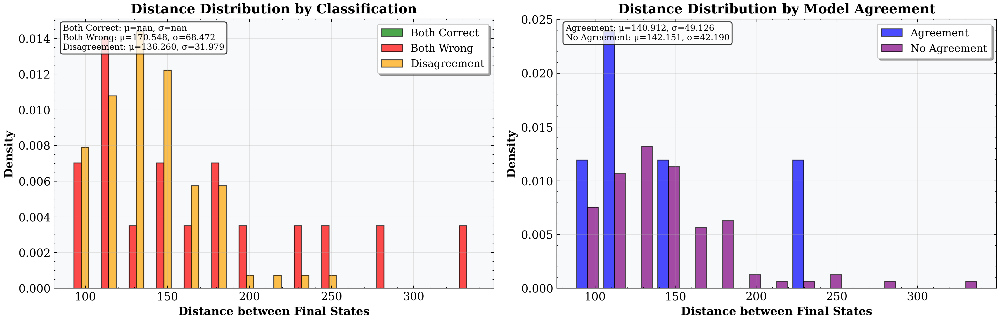

In [28]:
fig3 = plot_distance_distributions(teacher_trajectories[:, 1:, :], trajectories[:, 1:, :], acc_t, acc_edo, aggrement)